### C12_KOD

In [1]:
#gerekli kütüphanelerin import edilmesi
import matplotlib.pyplot as plt 
import numpy as np
from scipy.io.wavfile import read 
from IPython.lib.display import Audio
import scipy.signal as sgnl
from scipy.fftpack import fft, ifft
from scipy.io import loadmat

In [2]:
"""
filter_func(filter_name,degree): 
filtreleme amacıyla mat dosyasında kullanılacak filtrenin frekans cevabının genlik, faz ve grup gecikme grafiklerini oluşturur
ve b katsayısını döndürür.

filter_name(@param1): oluşturulan .mat filtre dosyasının ismi
degree(@param2): oluşturulan filtrenin N derecesi
"""
def filter_func(filter_name,degree):   
    filter_data = loadmat(f'{filter_name}') #filtrenin verisinin çıkarılması
    N=degree
    Coeffs = filter_data['ba'].astype(float) # filtre katsayılarının belirlenmesi

    b = Coeffs[:,0] # b katsayılarının çekilmesi

    w, Hw = sgnl.freqz(b,1) # w ve H(w) verilerinin ferqz fonksiyonu ile belirlenmesi 

    Hw_mag = abs(Hw) # frekans cevabının genliği
    Hw_phs = np.unwrap(np.angle(Hw)) # frekans cevabının fazı

    tau_w = -np.diff(Hw_phs)*(N/(2*np.pi)) # grup gecikmesi

    # grafiklerin çizdirilmesi
    plt.figure(figsize = (8, 15))
    plt.subplot(3,1,1), plt.plot(w/np.pi, Hw_mag), plt.ylabel('|H(w)|'), plt.xlabel('w /$\pi$ (rad/sample)')
    plt.title(f'{filter_name} için '+'$H(e^{j\omega})$ Genlik Cevabı')
    
    plt.subplot(3,1,2), plt.plot(w/np.pi, Hw_phs), plt.ylabel('degrees'), plt.xlabel('w /$\pi$ (rad/sample)')
    plt.title('Faz Cevabı')

    plt.subplot(3,1,3), plt.plot(w[1::]/np.pi, tau_w), plt.xlabel('w /$\pi$ (rad/sample)'), plt.ylabel('group delay (samples)')
    plt.title('group delay')
    plt.show()
    
    return b

In [3]:
"""
filter(audio, audio_len, b):
filtreleme amacıyla b katsayılarına göre ses verilerinin sırasıyla lfilter fonksiyonuna sokularak 
filtreleme işlemini gerçekleştirir ve filtrelenmiş sesin frekans cevabının genlik ve faz grafiklerini gösterir.  

audio(@param1): ses verisinin değerleri
audio_len(@param2): ses verisinin değerlerinin boyutu
b(@param3): b katsayılarını tutan liste parametresi
"""
def filter(audio, audio_len, b):
    voice = audio
    print('orjinal x[n] işareti için:')
    display(Audio(audio, rate = 44100)) # orjinal ses işareti
    
    for i in b: # sırasıyla b değişkeninde bulunan filtrelerin orjinal ses işaretine uygulanması 
        filtered_voice= sgnl.lfilter(i, 1, voice)
        voice = filtered_voice
        
    print(f'filtrelenmiş ses\'in x[n] işareti için:')
    display(Audio(voice, rate = 44100))
    
    w_filtred_voice = np.arange(-np.pi, np.pi, 2*np.pi/(audio_len)) 
    freq_filtered_voice = np.fft.fftshift(np.fft.fft(filtered_voice,audio_len)/audio_len) # filtrelenmiş sesin frekans cevabı

    # filtrelenmiş sesin frekans cevabının genliği
    plt.figure(figsize=(10,8))
    plt.stem(w_filtred_voice/np.pi, abs(freq_filtered_voice)), plt.ylabel('$Y(e^{j\omega})$'), plt.xlabel('w /$\pi$ (rad/sample)')

Eğitim1.wav bilgileri --> örnekleme miktarı=312221	kanal sayısı=1	Fs=44100


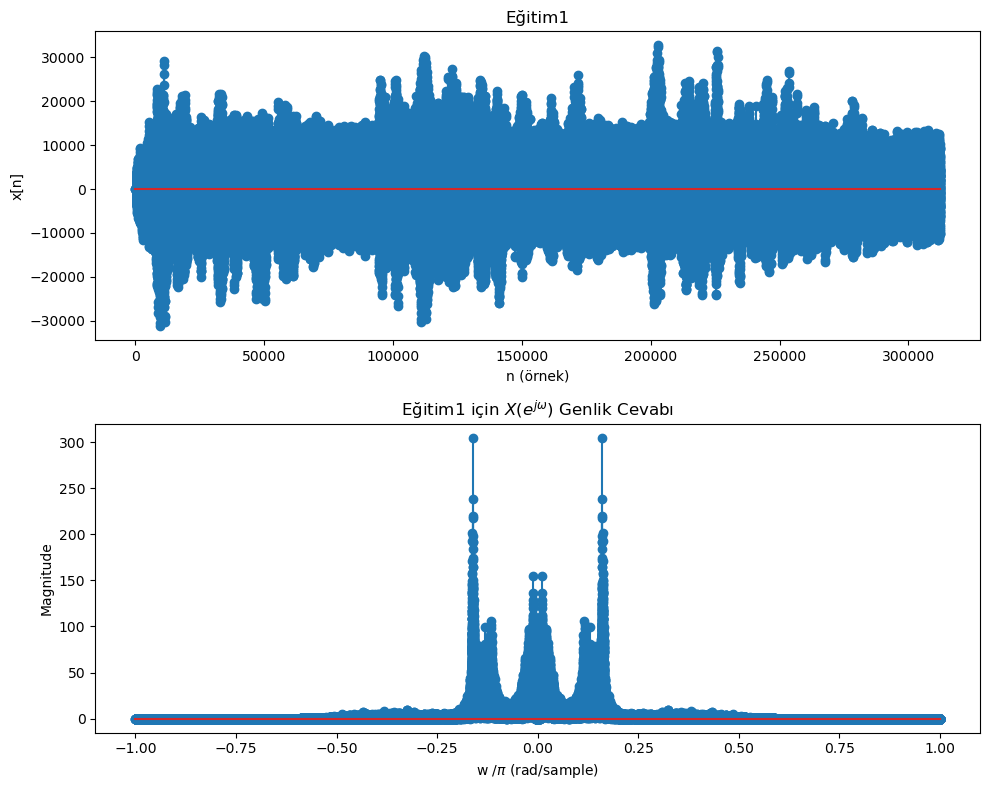

Eğitim1'nin x[n] işareti için:


Eğitim2.wav bilgileri --> örnekleme miktarı=360033	kanal sayısı=1	Fs=44100


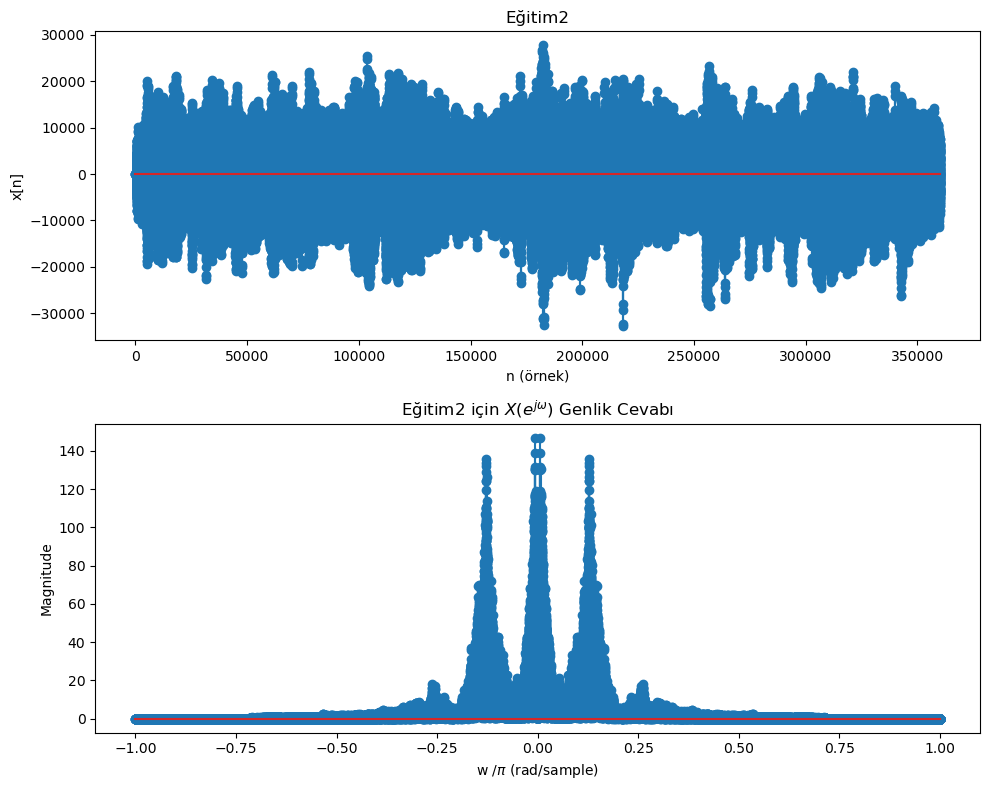

Eğitim2'nin x[n] işareti için:


Eğitim3.wav bilgileri --> örnekleme miktarı=357034	kanal sayısı=1	Fs=44100


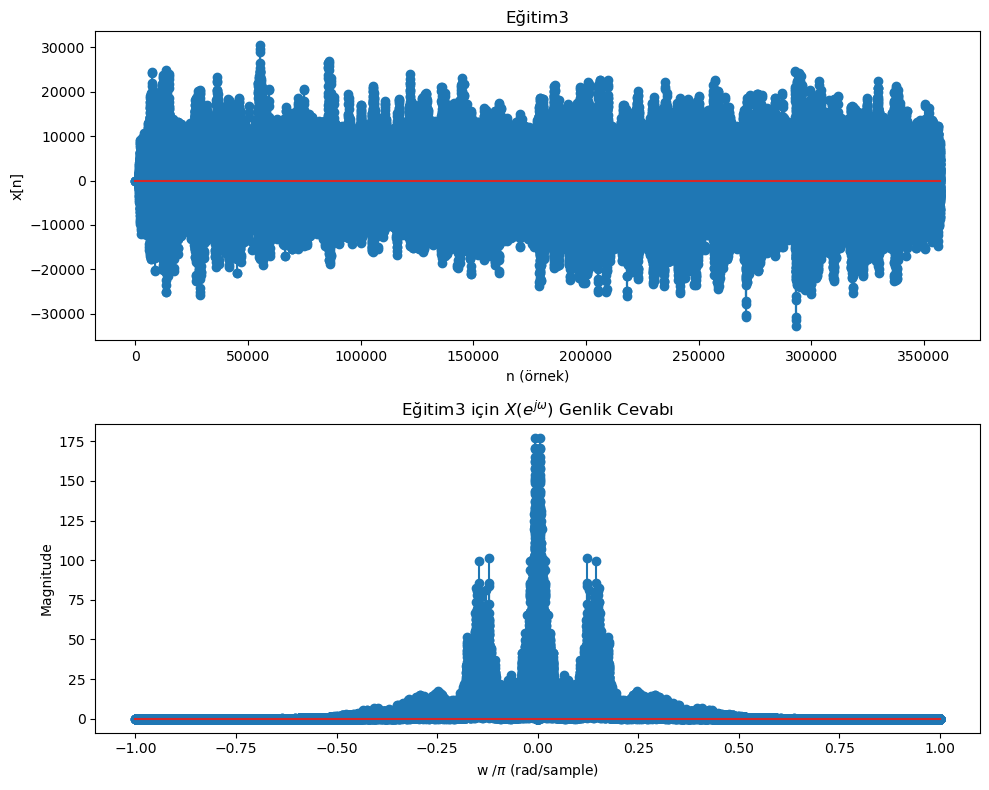

Eğitim3'nin x[n] işareti için:


Test1.wav bilgileri --> örnekleme miktarı=275999	kanal sayısı=1	Fs=44100


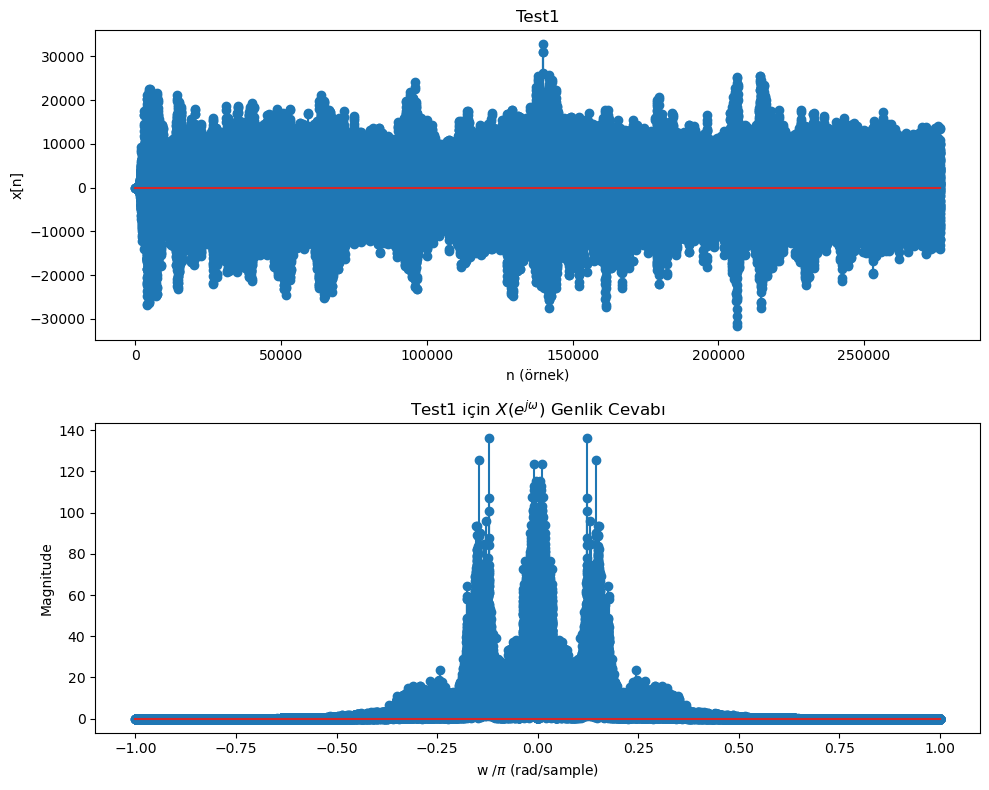

Test1'nin x[n] işareti için:


Test2.wav bilgileri --> örnekleme miktarı=283369	kanal sayısı=1	Fs=44100


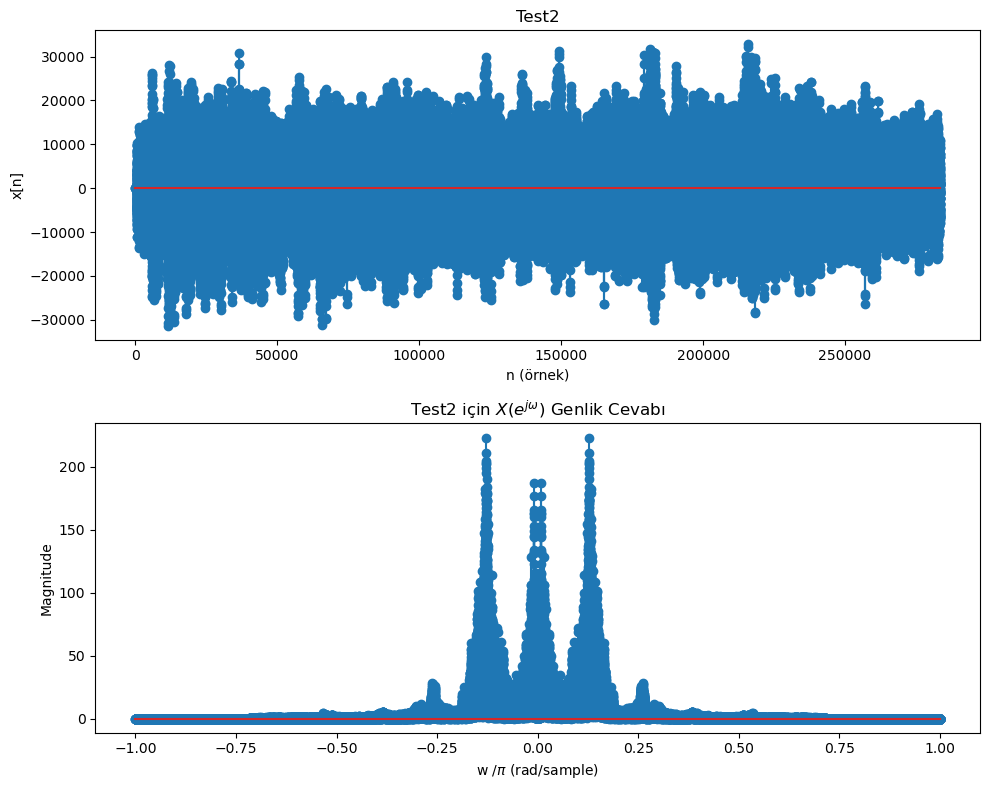

Test2'nin x[n] işareti için:


Test3.wav bilgileri --> örnekleme miktarı=321376	kanal sayısı=1	Fs=44100


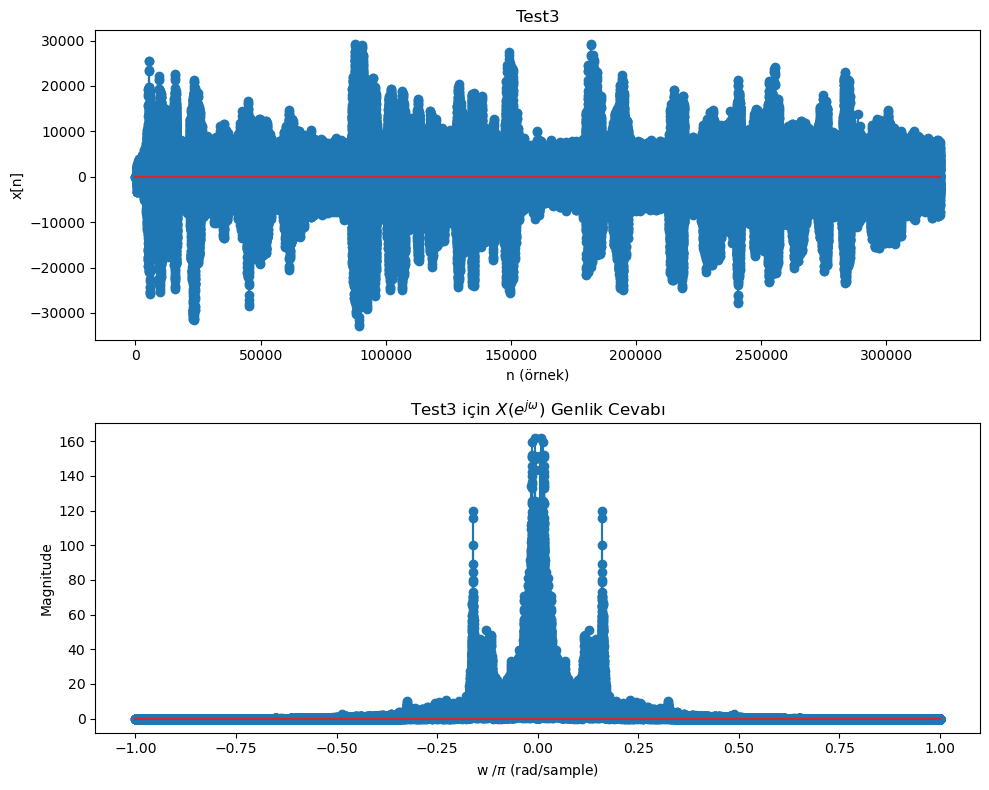

Test3'nin x[n] işareti için:


In [4]:
ses = ["Eğitim1", "Eğitim2", "Eğitim3", "Test1", "Test2", "Test3"] # eğitim ve test .wav ses dosyalarının isimleri 
xn_N = []
for i in range(len(ses)):
    Fs, x = read(f"{ses[i]}.wav")  # eğitim ve test ses dosyalarının okunması 
    if len(x.shape) == 2: # seslerin 2 kanallı olması durumunda tek kanalının alınması 
        xn = x[:, 0]
        print(f'{ses[i]}.wav bilgileri --> örnekleme miktarı={len(xn)}\tkanal sayısı=2\tFs={Fs}')
    else:
        xn = x
        print(f'{ses[i]}.wav bilgileri --> örnekleme miktarı={len(xn)}\tkanal sayısı=1\tFs={Fs}')
    N = len(xn) # ses verisinin uzunluğu
    xn_N.append([xn, N]) # ses verisi ve uzunluğunun aynı listeye eklenmesi
    n = np.arange(0, N) # örnek ekseni
    w = np.linspace(-np.pi,np.pi,N) # frekans ekseni
    ses_freq = np.fft.fftshift(np.fft.fft(xn, N) / N) # ses verisinin frekans cevabı
    # x[n] ve |X(w)| grafiklerinin çizdirilmesi
    plt.figure(figsize=(10,8))
    plt.subplot(211), plt.stem(n, xn), plt.xlabel("n (örnek)"), plt.ylabel("x[n]"), plt.title(ses[i])
    plt.subplot(212), plt.stem(w/np.pi, abs(ses_freq)), plt.xlabel('w /$\pi$ (rad/sample)'), plt.ylabel("Magnitude")
    plt.title(f"{ses[i]} için "+"$X(e^{j\omega})$ Genlik Cevabı")
    plt.tight_layout()
    plt.show()
    
    print(f'{ses[i]}\'nin x[n] işareti için:')
    display(Audio(xn, rate=Fs))

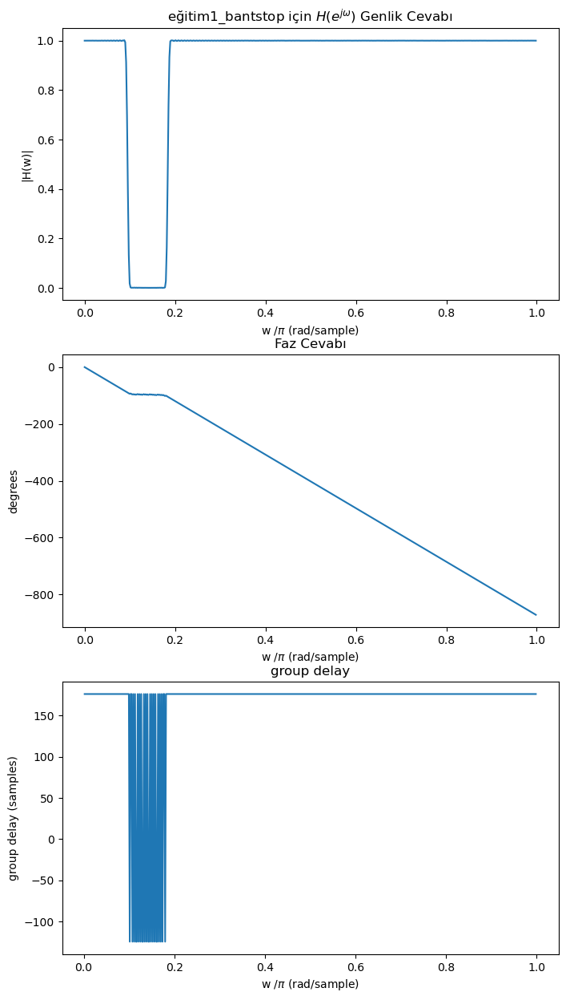

orjinal x[n] işareti için:


filtrelenmiş ses'in x[n] işareti için:


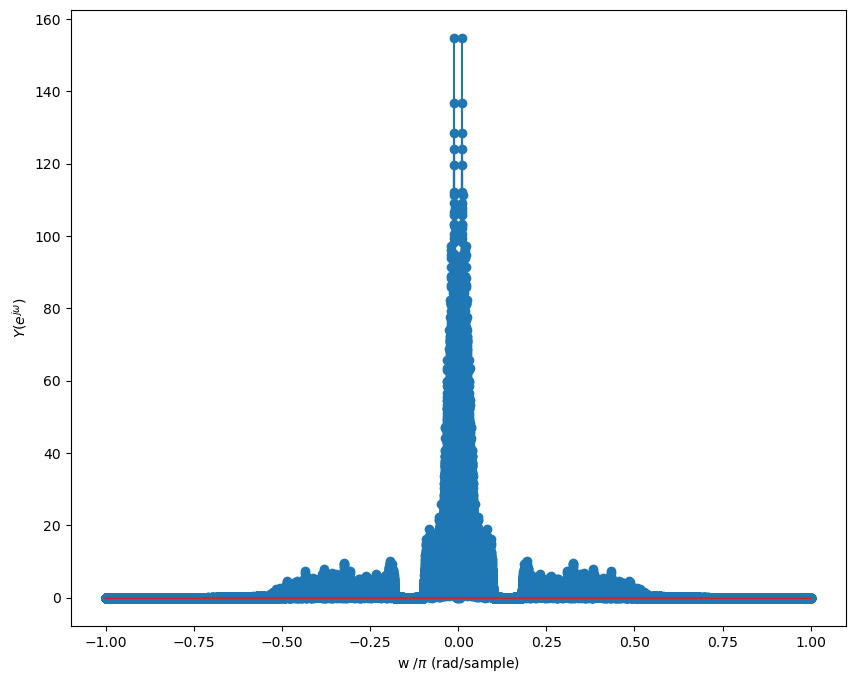

In [5]:
# eğitim 1 için oluşturulan band söndüren filtrenin eğitim 1 sesine uygulanması. Orjinal ve filtrelenmiş sesin incelenmesi
b1=filter_func('eğitim1_bantstop', 601)
filter(xn_N[0][0],xn_N[0][1],[b1])

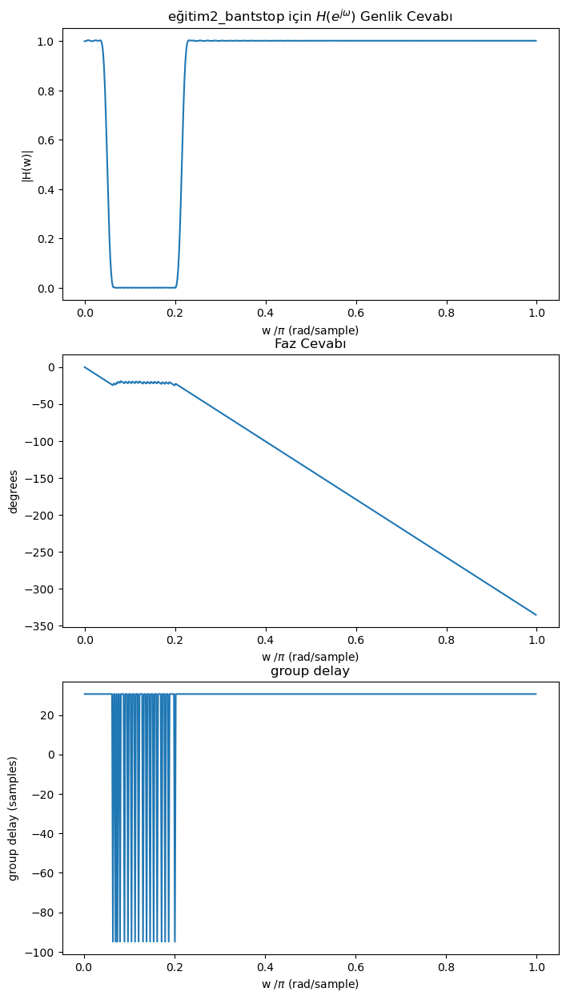

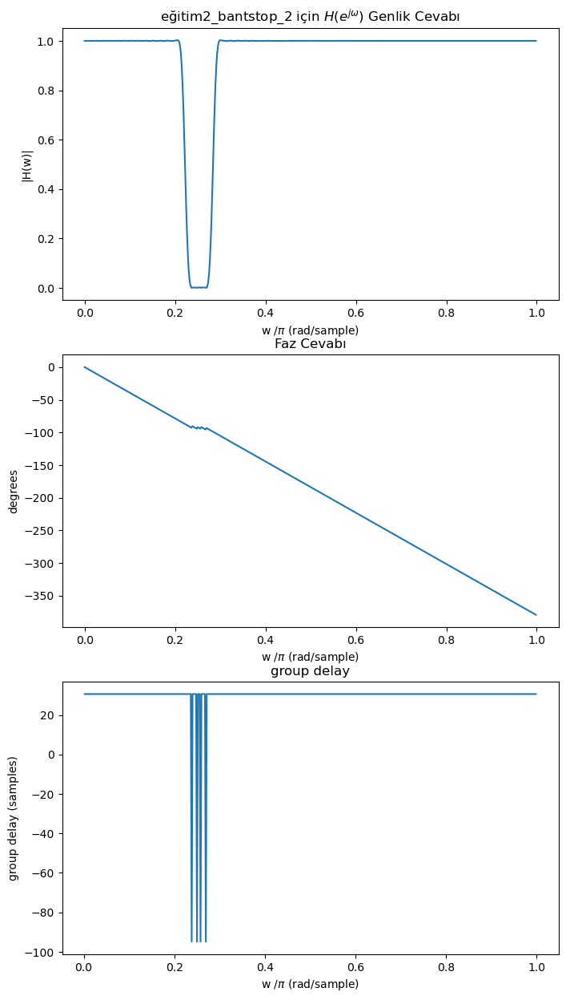

orjinal x[n] işareti için:


filtrelenmiş ses'in x[n] işareti için:


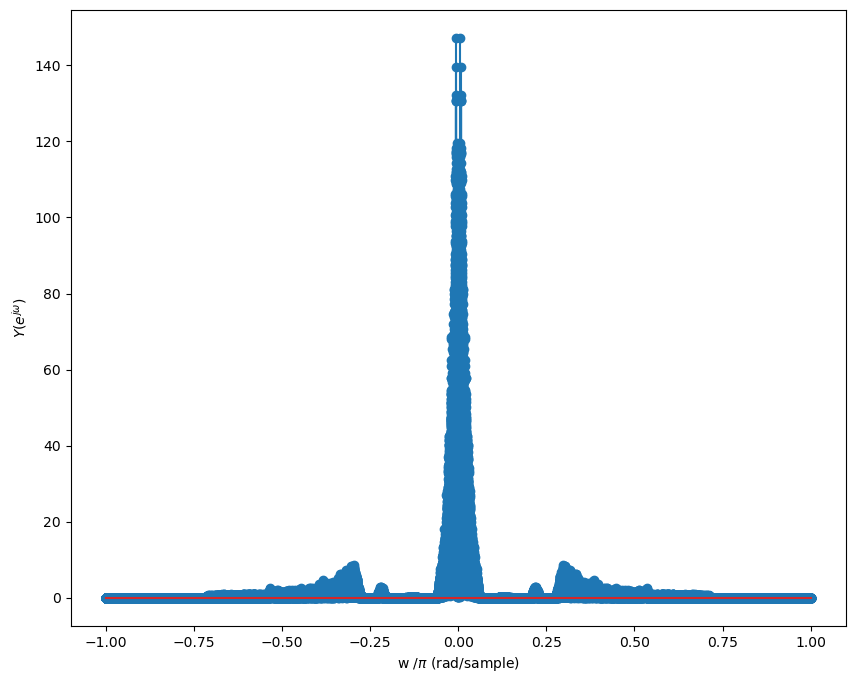

In [6]:
# eğitim 2 için oluşturulan band söndüren filtrelerin eğitim 2 sesine uygulanması. Orjinal ve filtrelenmiş sesin incelenmesi
b2=filter_func('eğitim2_bantstop',251)
b3=filter_func('eğitim2_bantstop_2',251)
filter(xn_N[1][0],xn_N[1][1],[b2, b3])

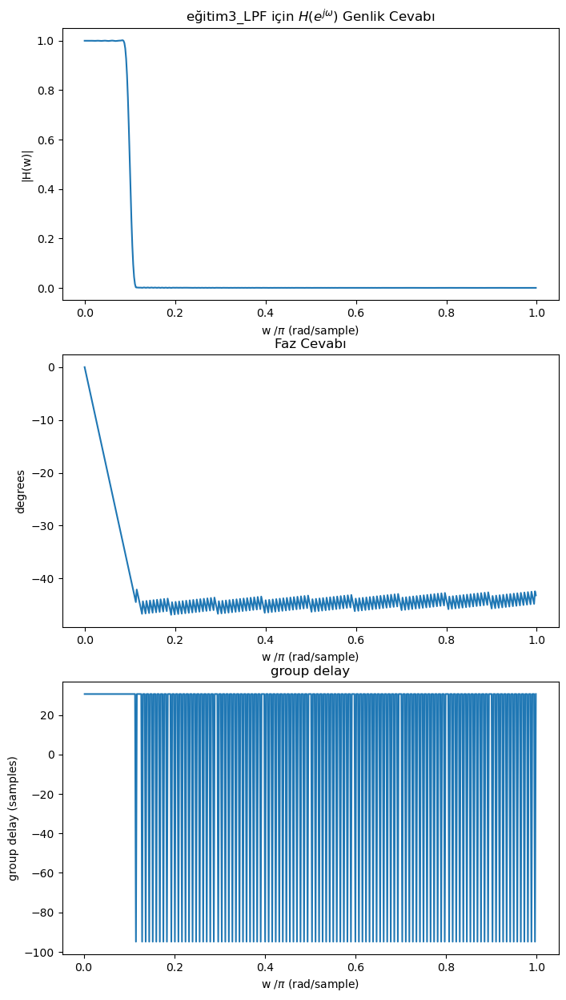

orjinal x[n] işareti için:


filtrelenmiş ses'in x[n] işareti için:


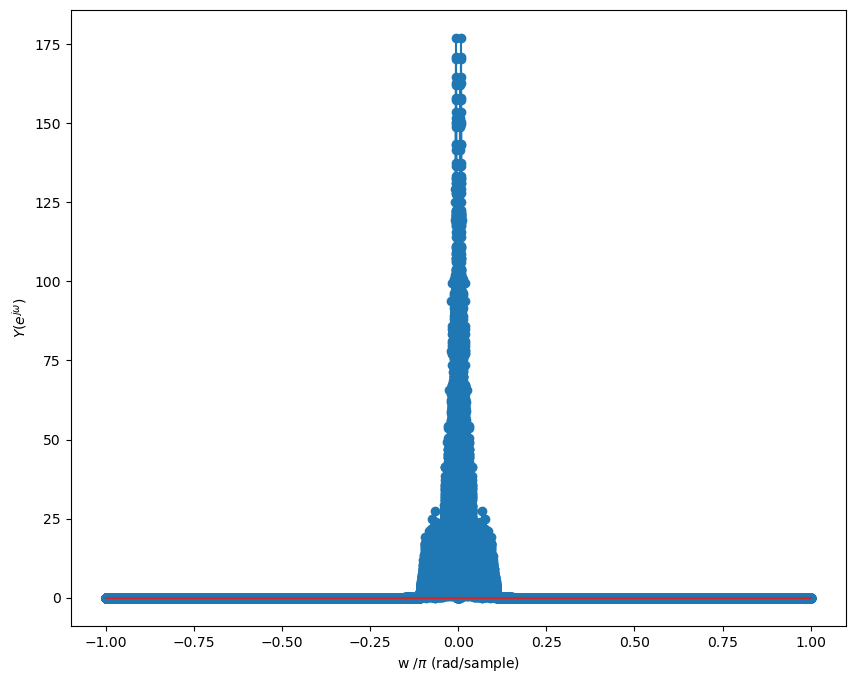

In [7]:
# eğitim 3 için oluşturulan alçak geçiren filtrenin eğitim 3 sesine uygulanması. Orjinal ve filtrelenmiş sesin incelenmesi
b4=filter_func('eğitim3_LPF',251)
filter(xn_N[2][0],xn_N[2][1],[b4])

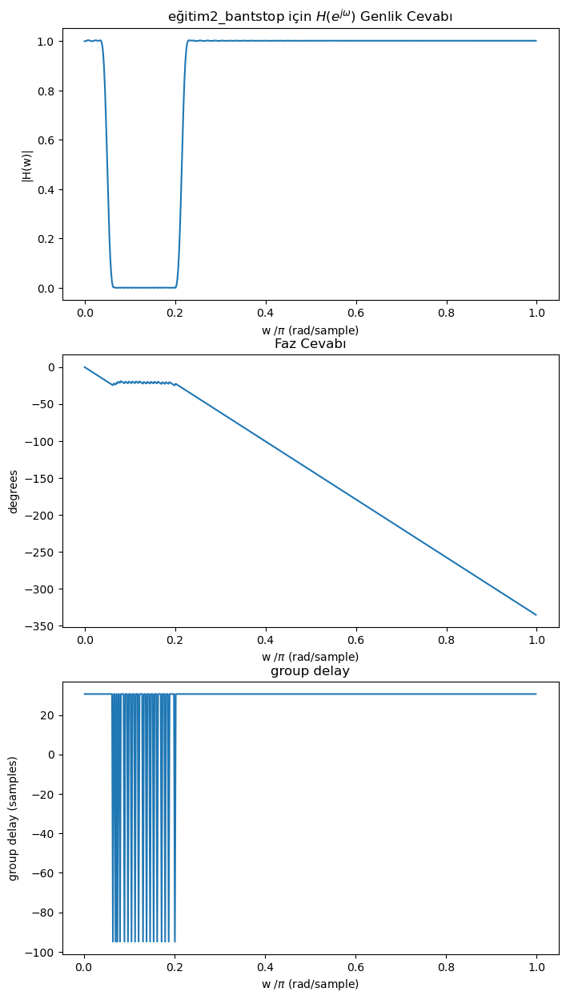

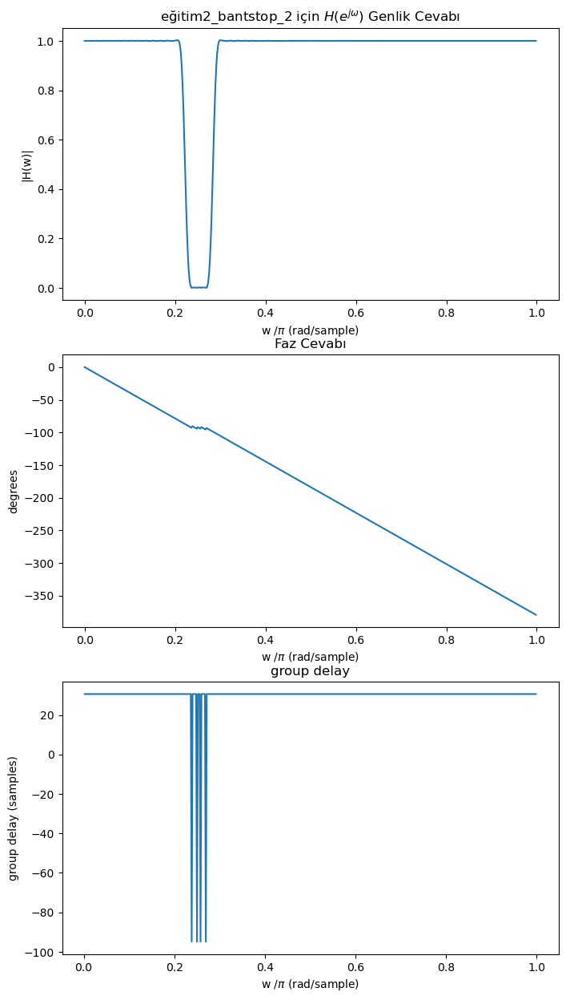

orjinal x[n] işareti için:


filtrelenmiş ses'in x[n] işareti için:


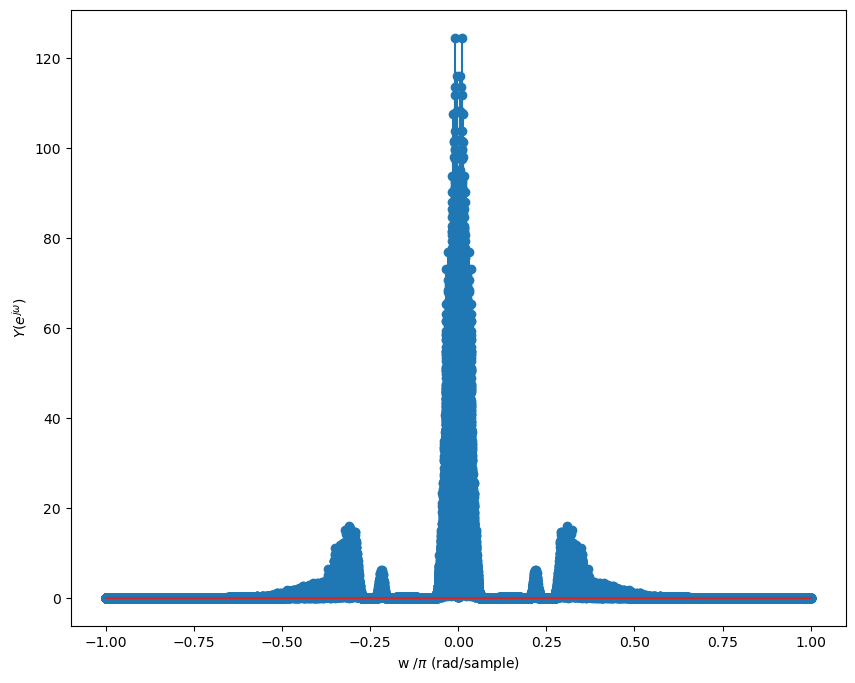

In [8]:
"""
Test 1 için en uygun filtrenin eğitim 2 için oluşturulan bant söndüren filtreleri olduğuna karar verilmiştir. 
Buna göre, eğitim 2 için oluşturulan filtreler test 1 sesine uygulanarak orjinal ve filtrelenmiş sesler aşağıdaki gibi çıkartılmıştır.
"""
b2=filter_func('eğitim2_bantstop',251)
b3=filter_func('eğitim2_bantstop_2',251)
filter(xn_N[3][0],xn_N[3][1],[b2, b3])

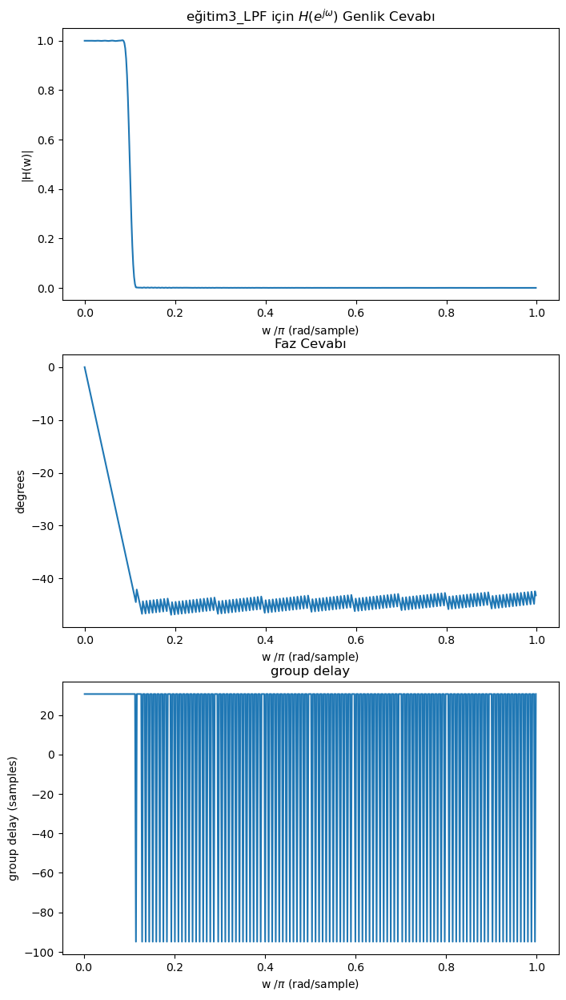

orjinal x[n] işareti için:


filtrelenmiş ses'in x[n] işareti için:


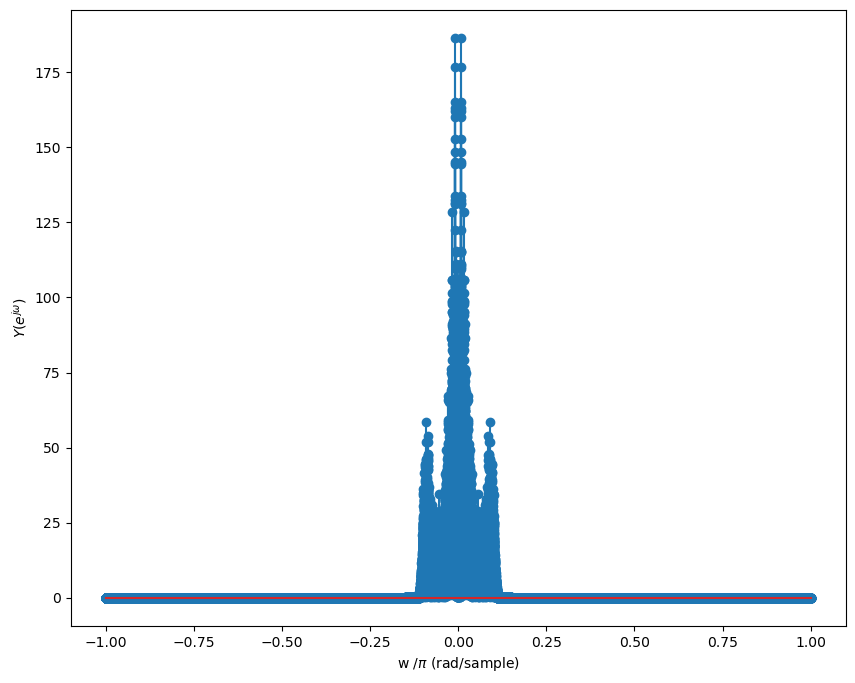

In [9]:
"""
Test 2 için en uygun filtrenin eğitim 3 için oluşturulan alçak geçiren filtresi olduğuna karar verilmiştir. 
Buna göre, eğitim 3 için oluşturulan filtreler test 2 sesine uygulanarak orjinal ve filtrelenmiş sesler aşağıdaki gibi çıkartılmıştır.
"""
b4=filter_func('eğitim3_LPF',251)
filter(xn_N[4][0],xn_N[4][1],[b4])

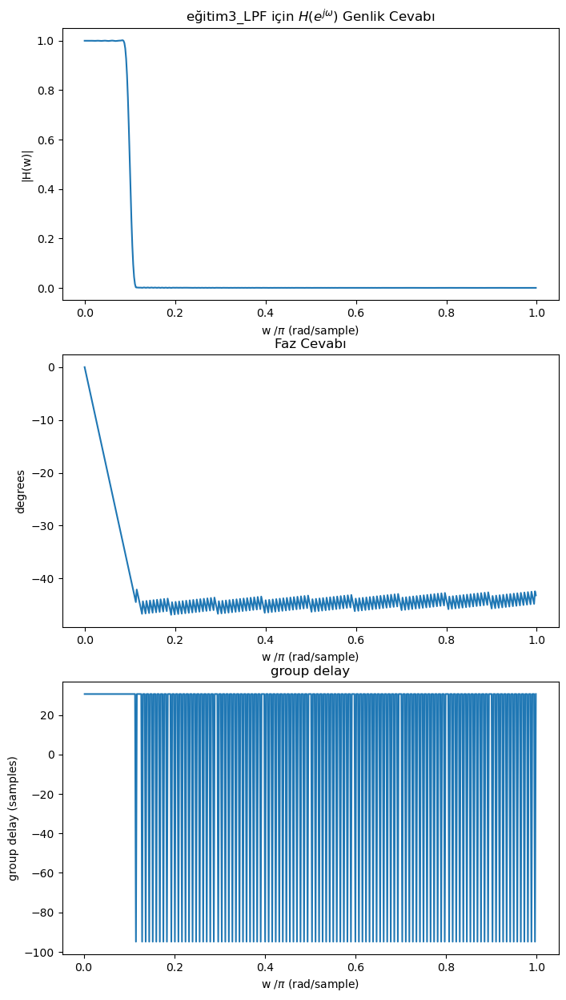

orjinal x[n] işareti için:


filtrelenmiş ses'in x[n] işareti için:


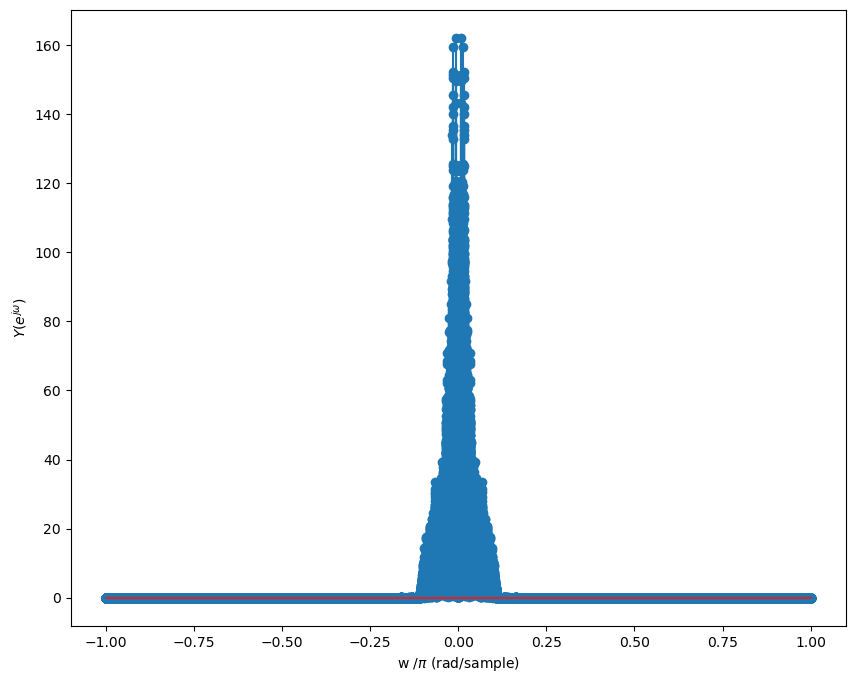

In [10]:
"""
Test 3 için en uygun filtrenin eğitim 3 için oluşturulan alçak geçiren filtresi olduğuna karar verilmiştir. 
Buna göre, eğitim 3 için oluşturulan filtreler test 3 sesine uygulanarak orjinal ve filtrelenmiş sesler aşağıdaki gibi çıkartılmıştır.
"""
b4=filter_func('eğitim3_LPF',251)
filter(xn_N[5][0],xn_N[5][1],[b4])